# TP FINAL y coso

## Explicacion de que estamos prediciendo

## Exploracion del dataset

## Iniciando el modelo

In [2]:
import timm
model = timm.create_model('inception_v3', pretrained=True)
model.eval()

/home/don-berge/Documentos/IIA TP FINAL/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


InceptionV3(
  (Conv2d_1a_3x3): ConvNormAct(
    (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
    (bn): BatchNormAct2d(
      32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True
      (drop): Identity()
      (act): ReLU(inplace=True)
    )
  )
  (Conv2d_2a_3x3): ConvNormAct(
    (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNormAct2d(
      32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True
      (drop): Identity()
      (act): ReLU(inplace=True)
    )
  )
  (Conv2d_2b_3x3): ConvNormAct(
    (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNormAct2d(
      64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True
      (drop): Identity()
      (act): ReLU(inplace=True)
    )
  )
  (Pool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (Conv2d_3b_1x1): ConvNormAct(
    (conv): Conv2d(64, 80, kernel_size

## Descargando el dataset

In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("vikranthkanumuru/naruto-hand-sign-dataset")

print("Path to dataset files:", path)

# Si no funciona proba descargarlo de aca
# https://www.kaggle.com/datasets/vikranthkanumuru/naruto-hand-sign-dataset

/home/don-berge/Documentos/IIA TP FINAL/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


  7%|▋         | 139M/2.02G [00:35<08:17, 4.06MB/s] 


KeyboardInterrupt: 

## Preprocesamiento de imagenes

Copiado de hugging face

*explicacion*

In [3]:
import urllib
from PIL import Image
from timm.data import resolve_data_config
from timm.data.transforms_factory import create_transform


config = resolve_data_config({}, model=model)
transform = create_transform(**config)

def preprocess(filename):
    img = Image.open(filename).convert('RGB')
    tensor = transform(img).unsqueeze(0) # transform and add batch dimension
    return (tensor, img)

## Sellos de mano
Con el siguiente codigo se puede obtener, para cada uno de los sellos de mano posibles, una muestra del conjunto de entrenamiento.

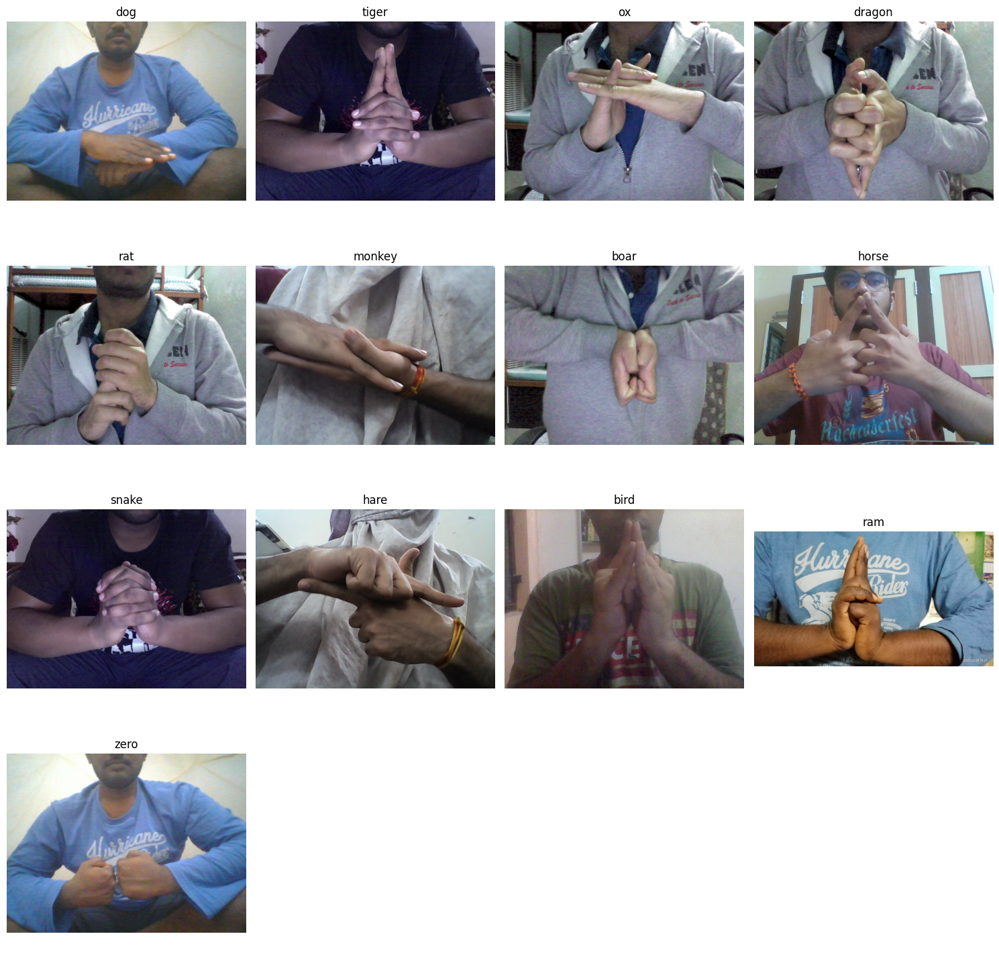

In [4]:
# Go to the folder dataset/train and get a random image from each subfolder.
import os
import random
# Display the random images in a 4x4 grid
import matplotlib.pyplot as plt

def get_random_images_from_subfolders(base_path):
    images = []
    for subfolder in os.listdir(base_path):
        subfolder_path = os.path.join(base_path, subfolder)
        if os.path.isdir(subfolder_path):
            files = [f for f in os.listdir(subfolder_path) if f.endswith('.jpg')]
            if files:
                random_file = random.choice(files)
                images.append((subfolder, os.path.join(subfolder_path, random_file)))
    return images

base_path = "dataset/train"
random_images = get_random_images_from_subfolders(base_path)
def display_images(images, cols=4):
    rows = (len(images) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(15, 15))
    for i, (subfolder, img_path) in enumerate(images):
        img = Image.open(img_path)
        ax = axes[i // cols, i % cols]
        ax.imshow(img)
        ax.set_title(subfolder)
        ax.axis('off')
    for j in range(i + 1, rows * cols):
        axes[j // cols, j % cols].axis('off')
    plt.tight_layout()
    plt.show()

display_images(random_images, cols=4)

## Probando con el modelo original

In [7]:
# Importa el módulo torch para trabajar con tensores y modelos de deep learning
import torch

# Descarga el archivo con los nombres de las categorías de ImageNet
url, filename = ("https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt", "imagenet_classes.txt")
urllib.request.urlretrieve(url, filename) 

# Lee el archivo y guarda los nombres de las categorías en una lista
with open("imagenet_classes.txt", "r") as f:
    categories = [s.strip() for s in f.readlines()]

def infer(filename):
    # Preprocesa la imagen y obtiene el tensor correspondiente
    tensor, img = preprocess(filename)

    # Desactiva el cálculo de gradientes, ya que estamos en modo inferencia
    with torch.no_grad():
        # Pasa el tensor de la imagen por el modelo para obtener las predicciones
        out = model(tensor)
        
    # Aplica la función softmax para convertir las salidas del modelo en probabilidades
    probabilities = torch.nn.functional.softmax(out[0], dim=0)


    # Obtiene las 5 categorías con mayor probabilidad
    top5_prob, top5_catid = torch.topk(probabilities, 5)

    # Imprime el nombre de la categoría y su probabilidad para las 5 predicciones principales
    for i in range(top5_prob.size(0)):
        print(categories[top5_catid[i]], top5_prob[i].item())

for subfolder, img_path in random_images:
    print(f"Predictions for {subfolder}:")
    infer(img_path)
    print("\n")

Predictions for dog:
cowboy hat 0.12412817776203156
tench 0.08675888180732727
sunscreen 0.08666973561048508
sombrero 0.08350703865289688
shower cap 0.04830996319651604


Predictions for tiger:
syringe 0.12627288699150085
potter's wheel 0.03716457635164261
Band Aid 0.0312965027987957
burrito 0.024553630501031876
American lobster 0.021149825304746628


Predictions for ox:
iron 0.10160890221595764
ocarina 0.065492182970047
lotion 0.054247256368398666
hotdog 0.03237678110599518
flute 0.02785259112715721


Predictions for dragon:
syringe 0.16965681314468384
nail 0.11795473098754883
seat belt 0.11078871786594391
Windsor tie 0.06476791203022003
screw 0.03422221913933754


Predictions for rat:
lab coat 0.2827811539173126
Windsor tie 0.15125881135463715
whistle 0.07507818937301636
suit 0.04750645533204079
syringe 0.021772772073745728


Predictions for monkey:
Windsor tie 0.31559959053993225
lab coat 0.23120982944965363
vestment 0.12246096134185791
bow tie 0.05088287964463234
Band Aid 0.01818749

Ahora veamos la distribucion de las predicciones, por cada clase

In [5]:
# Given a class of the train dataset(that is, a subfolder name), get a histogram of
# the predictions for all the images in that class.

import numpy as np

def get_predictions_for_class(class_name, base_path, num_classes=5):
    class_path = os.path.join(base_path, class_name)
    predictions = {}
    for img_file in os.listdir(class_path):
        if img_file.endswith('.jpg'):
            img_path = os.path.join(class_path, img_file)
            tensor, _ = preprocess(img_path)
            with torch.no_grad():
                out = model(tensor)
            probabilities = torch.nn.functional.softmax(out[0], dim=0)

            # Consideramos solo las 5 primeras categorías con mayor probabilidad
            top_prob, top_catid = torch.topk(probabilities, num_classes)

            for i in range(top_prob.size(0)):
                category = categories[top_catid[i]]
                prob = top_prob[i].item()
                
                if category not in predictions:
                    predictions[category] = []

                predictions[category].append(prob)

    # Con las predicciones obtenidas, calculamos la media de las probabilidades para cada categoría
    predictions = [(cat, np.mean(probs), np.std(probs)) for cat, probs in predictions.items()]
    # Ordenamos las predicciones por probabilidad
    predictions.sort(key=lambda x: x[1], reverse=True)    

    return predictions

def plot_circular(ax, top_preds):
    categories_plot = [cat for cat, _, _ in top_preds]
    values_plot = [float(prob) for _, prob, _ in top_preds]
    std_devs_plot = [float(std) for _, _, std in top_preds]
    
    N = len(categories_plot)
    angles = np.linspace(0, 2 * np.pi, N, endpoint=False).tolist()

    # Show circular barplot using the top num_classes predictions
    ax.bar(angles, values_plot, width=2*np.pi/N, align='edge', color='skyblue', edgecolor='black', yerr=std_devs_plot, capsize=5)

    ax.set_xticks([a + np.pi/N for a in angles])
    ax.set_xticklabels(categories_plot, fontsize=10, rotation=90)
    ax.set_yticklabels([])

def plot_predictions_circular_bar(subfolder, img_path, top_n=20, num_classes=5):
    fig = plt.figure(figsize=(16, 8))
    # Show image
    ax1 = fig.add_subplot(1, 3, 1)
    img = Image.open(img_path)
    ax1.imshow(img)
    ax1.set_title(f"Sample image: {subfolder}")
    ax1.axis('off')

    # Show circular barplot using the top num_classes predictions
    ax2 = fig.add_subplot(1, 3, 3, polar=True)
    ax2.set_title(f'Top 5 for Class: {subfolder}', va='bottom')
    predictions = get_predictions_for_class(subfolder, base_path, num_classes=num_classes)[:top_n]
    plot_circular(ax2, predictions)

    # Show circular barplot using only one class
    ax3 = fig.add_subplot(1, 3, 2, polar=True)
    ax3.set_title(f'Top for Class: {subfolder}', va='bottom')
    predictions = get_predictions_for_class(subfolder, base_path, num_classes=1)[:top_n]
    plot_circular(ax3, predictions)
    
    plt.tight_layout()
    plt.show()


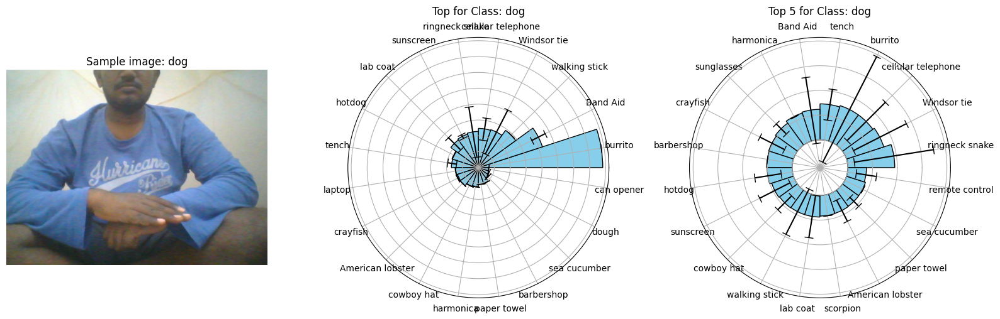

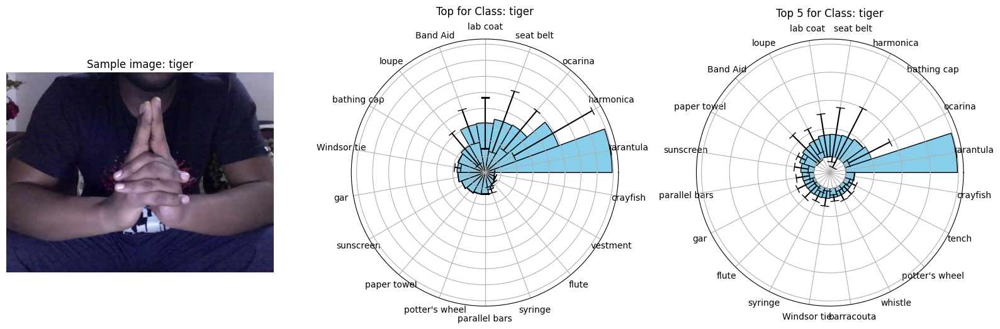

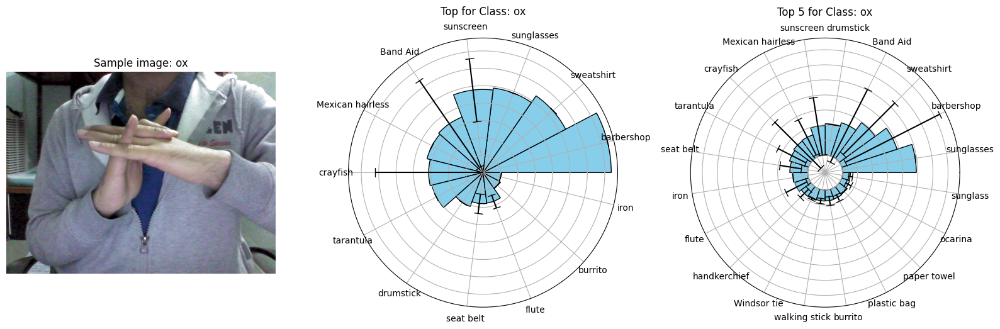

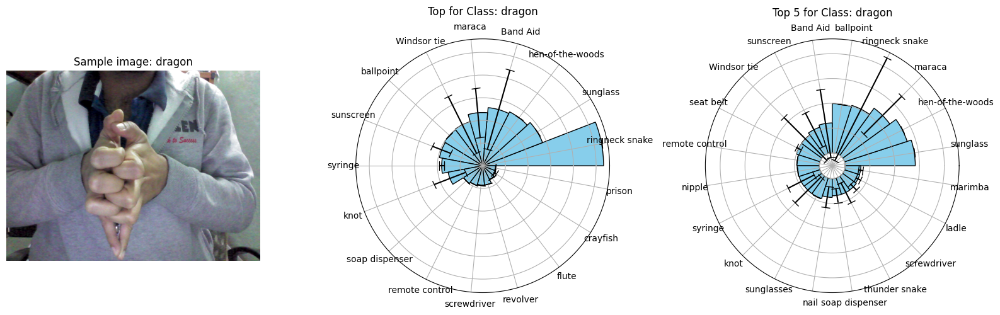

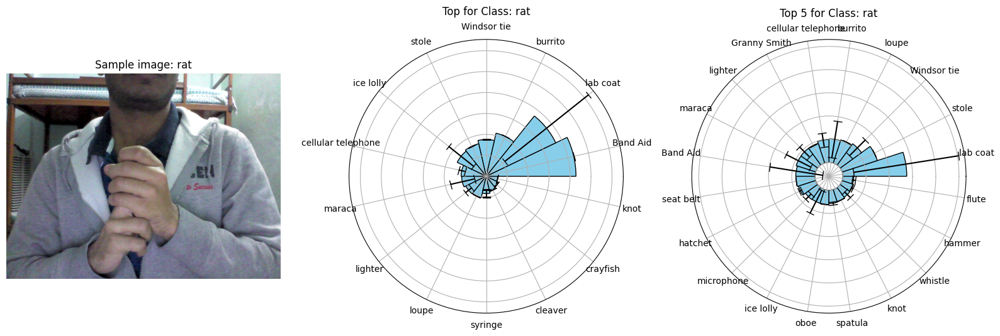

...

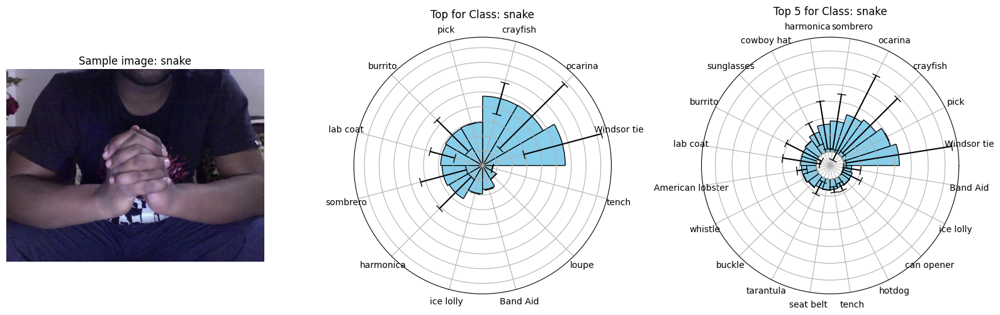

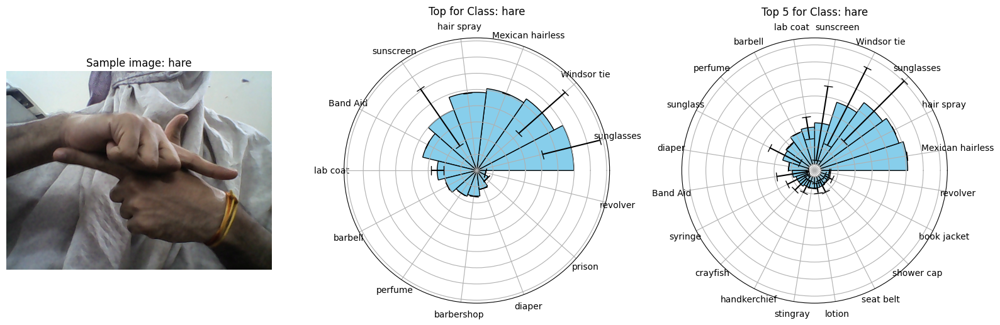

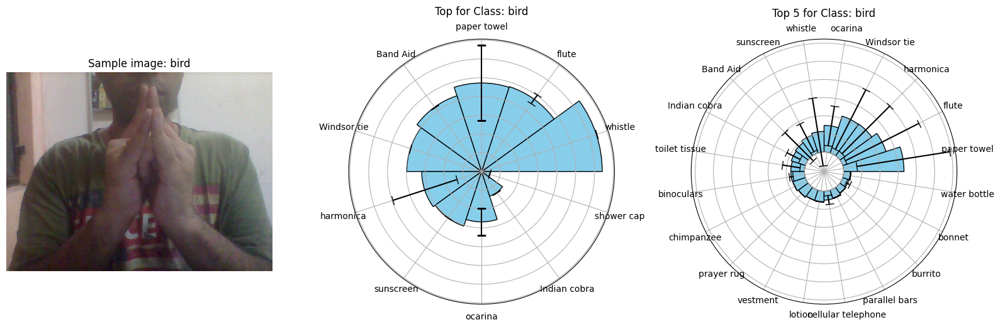

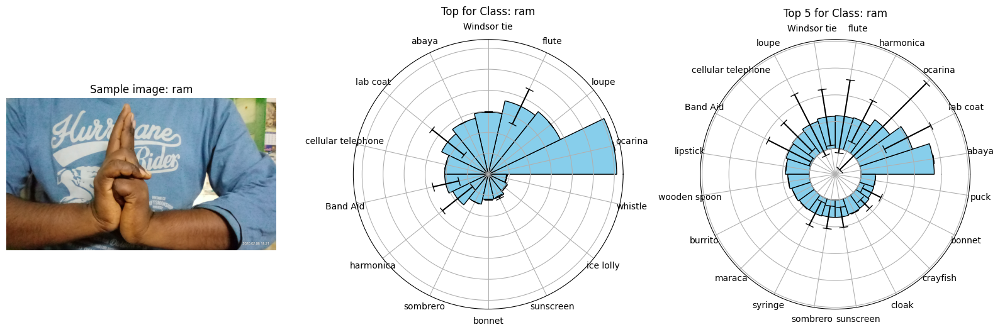

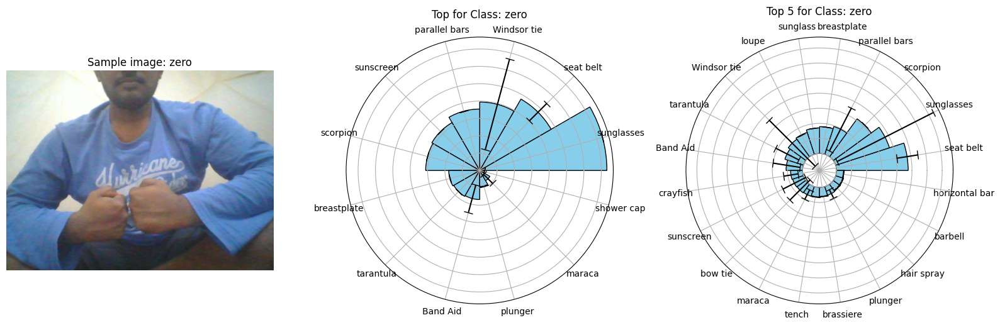

In [8]:
for subfolder, img_path in random_images:
    plot_predictions_circular_bar(subfolder, img_path, num_classes=5)

*comentarios si lo ameritan pero no se*

#### Entrenando el modelo

#### Usar data augmentation?

#### Probar entrenar el modelo para reconozca manos y de ahi entrenarlo para sellos?